# Support Vector Machines - SVM
## Laboratorio 3

## [Fraude en el Vino](https://en.wikipedia.org/wiki/Wine_fraud)

El fraude en el vino se relaciona a los aspectos comerciales del vino.  El tipo más prevalente de fraude es aquel en el cual los vinos son adulterados, generalmente con la adición de productos más baratos (e.g. jugos) y, a veces, con químicos dañinos y endulcorantes (para compensar el color o sabor).

La falsificación y la re-etiquetación de vinos inferiores y más baratos haciéndolos parecer marcas más caras es otro tipo común de fraude con vino.

<img src="wine.jpg">

## Objetivos del Laboratorio

Una compañía distribuidora, que recientemente fue víctima de fraude, ha completado una auditoría de varias muestras de vino a través del uso de análisis químico.  La compañía se especializa en la exportación de vinos de una calidad extremadamente alta y muy valiosos.  El fraude fue cometido por un proveedor que intentó pasar vinos baratos, de calidad inferior, como vinos de más alta gama.  La compañía distribuidora los ha contratado a Ustedes para intentar crear un modelo de aprendizaje de máquina (ML) que pueda ayudar a detectar muestras de vino de calidad baja ("fraude").  Quieren saber si siquiera es posible detectar tal diferencia.  


Fuente de datos: *P. Cortez, A. Cerdeira, F. Almeida, T. Matos and J. Reis. Modeling wine preferences by data mining from physicochemical properties.
In Decision Support Systems, Elsevier, 47(4):547-553, 2009.*

---
---

**La meta general es utilizar el conjunto de datos adjunto para desarrollar un modelo que intenta predecir si un vino es legítimo "Legit" o fraudulento "Fraud" basado en varias características químicas.**

---
---

**Rubrica**

**(50 puntos) Análisis Exploratorio:**
* Identifica el tipo de archivo .data y la forma de leerlo
* Estudia las variables cuantitativas mediante técnicas de estadística descriptiva
* Hace gráficos exploratorios como histogramas, diagramas de cajas y bigotes, gráficos de dispersión que ayudan a explicar los datos
* Analiza las correlaciones entre las variables, trata de explicar los outliers (datos atípicos) y toma decisiones acertadas ante la presencia de valores faltantes.
* Estudia las variables categóricas
* Elabora gráficos de barra, tablas de frecuencia y de proporciones
* Elabora gráficos adecuados según el tipo de dato que representan
* Explica muy bien todos los procedimientos y los hallazgos que va haciendo.
* Realiza la limpieza de datos para que se tenga un conjunto de datos que permita usar modelos

**(36 puntos) Clasificación**
* Realiza varios modelos de Clasificación, analiza los resultados para identificar el de mejor rendimiento
        
**(14 puntos) Hallazgos y conclusiones.**
* Hace la recomendación correcta para la Compañía Distribuidora

In [1]:
import pandas as pd # Import Pandas for data manipulation using dataframes
import numpy as np # Import Numpy for data statistical analysis 
import matplotlib.pyplot as plt # Import matplotlib for data visualisation
import seaborn as sns # Statistical data visualization
from pandas_profiling import ProfileReport
from quickda.clean_data import *

# Leer archivo csv
df = pd.read_csv('./wine_fraud.csv')
df.info()

C:\Users\Michy S\AppData\Local\Temp\ipykernel_9748\1650187709.py:5: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  quality               6497 non-null   object 
 12  type                  6497 non-null   object 
dtypes: float64(11), object(2)
memory usage: 660.0+ KB


In [2]:
#Se realiza la codificación de la columna quality
data_encoded = pd.get_dummies(df, columns=['quality'], prefix='', prefix_sep='')
df = data_encoded
#Se realiza la codificación de la columna type
data_encoded2 = pd.get_dummies(df, columns=['type'], prefix='', prefix_sep='')
df = data_encoded2

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  Fraud                 6497 non-null   uint8  
 12  Legit                 6497 non-null   uint8  
 13  red                   6497 non-null   uint8  
 14  white                 6497 non-null   uint8  
dtypes: float64(11), uint8

In [4]:
# Se realiza un cambio de tipos de variable para un mayor orden
df["Fraud"] = df["Fraud"].astype('int64')
df["Legit"] = df["Legit"].astype('int64')
df["red"] = df["red"].astype('int64')
df["white"] = df["white"].astype('int64')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         6497 non-null   float64
 1   volatile acidity      6497 non-null   float64
 2   citric acid           6497 non-null   float64
 3   residual sugar        6497 non-null   float64
 4   chlorides             6497 non-null   float64
 5   free sulfur dioxide   6497 non-null   float64
 6   total sulfur dioxide  6497 non-null   float64
 7   density               6497 non-null   float64
 8   pH                    6497 non-null   float64
 9   sulphates             6497 non-null   float64
 10  alcohol               6497 non-null   float64
 11  Fraud                 6497 non-null   int64  
 12  Legit                 6497 non-null   int64  
 13  red                   6497 non-null   int64  
 14  white                 6497 non-null   int64  
dtypes: float64(11), int64

In [6]:
# Se describen los datos
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,Fraud,Legit,red,white
count,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000,6497.000000
mean,7.215307,0.339666,0.318633,5.443235,0.056034,30.525319,115.744574,0.994697,3.218501,0.531268,10.491801,0.037864,0.962136,0.246114,0.753886
std,1.296434,0.164636,0.145318,4.757804,0.035034,17.749400,56.521855,0.002999,0.160787,0.148806,1.192712,0.190881,0.190881,0.430779,0.430779
min,3.800000,0.080000,0.000000,0.600000,0.009000,1.000000,6.000000,0.987110,2.720000,0.220000,8.000000,0.000000,0.000000,0.000000,0.000000
25%,6.400000,0.230000,0.250000,1.800000,0.038000,17.000000,77.000000,0.992340,3.110000,0.430000,9.500000,0.000000,1.000000,0.000000,1.000000
50%,7.000000,0.290000,0.310000,3.000000,0.047000,29.000000,118.000000,0.994890,3.210000,0.510000,10.300000,0.000000,1.000000,0.000000,1.000000
75%,7.700000,0.400000,0.390000,8.100000,0.065000,41.000000,156.000000,0.996990,3.320000,0.600000,11.300000,0.000000,1.000000,0.000000,1.000000
max,15.900000,1.580000,1.660000,65.800000,0.611000,289.000000,440.000000,1.038980,4.010000,2.000000,14.900000,1.000000,1.000000,1.000000,1.000000


<AxesSubplot: >

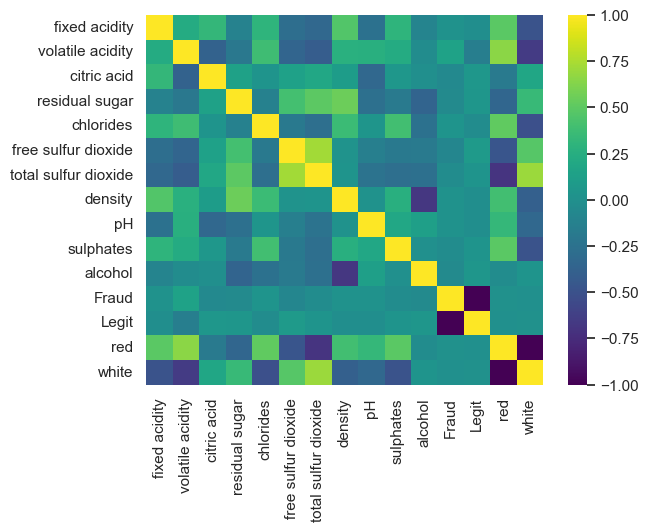

In [7]:
# Gráfico de correlación entre los datos
sns.heatmap(df.corr(),cmap = 'viridis')

In [8]:
# Reporte general de los datos
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

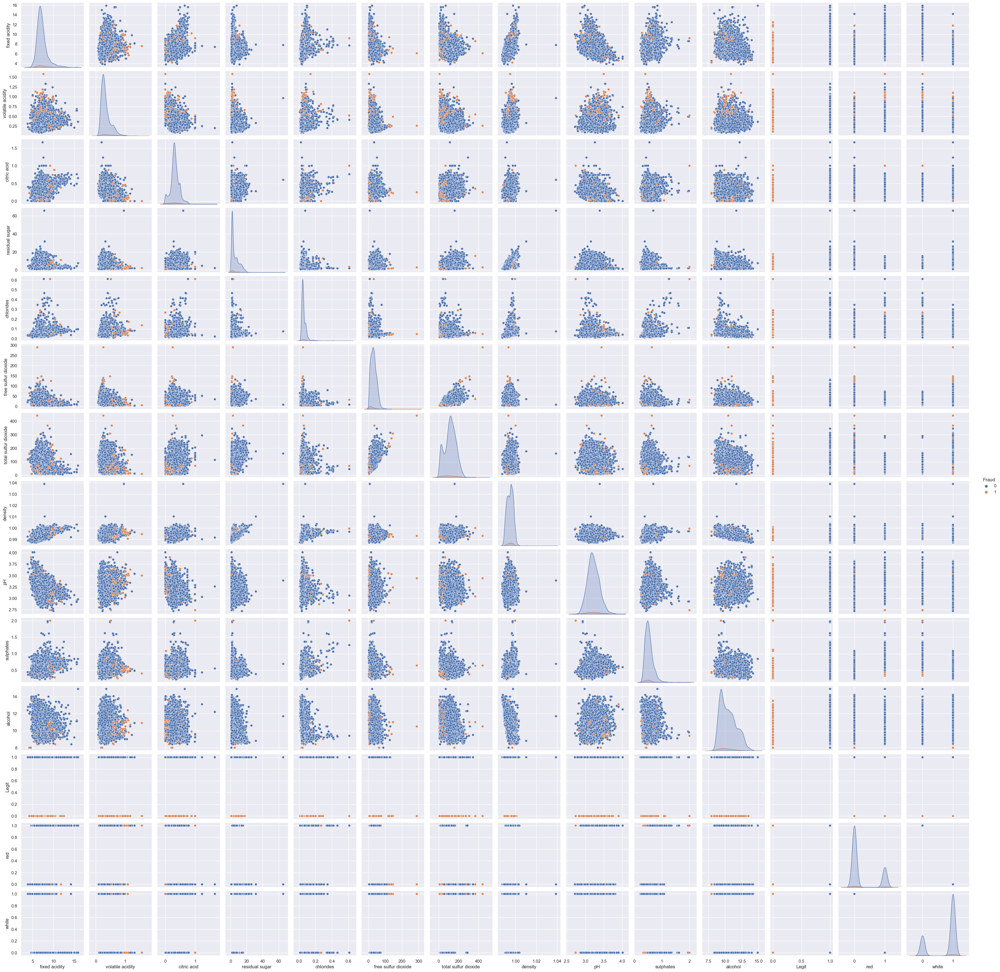

In [9]:
# Gráficos de correlación entre todas las columnas
sns.pairplot(df, hue = 'Fraud')

<AxesSubplot: >

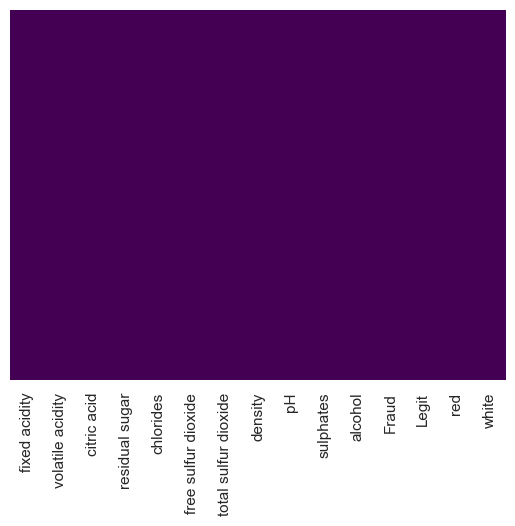

In [10]:
# Gráfico para ver si existen datos faltantes
sns.heatmap(df.isnull(), yticklabels = False, cbar = False, cmap = 'viridis')

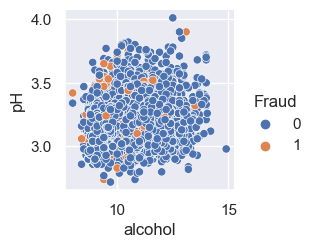

In [11]:
# Inicio de gráficos descriptivos
sns.pairplot(df, x_vars=['alcohol'], y_vars=['pH'], hue='Fraud');

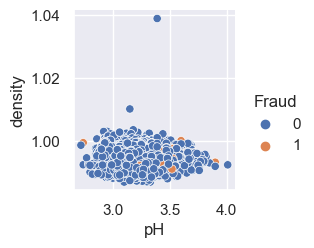

In [12]:
sns.pairplot(df, x_vars=['pH'], y_vars=['density'], hue='Fraud');

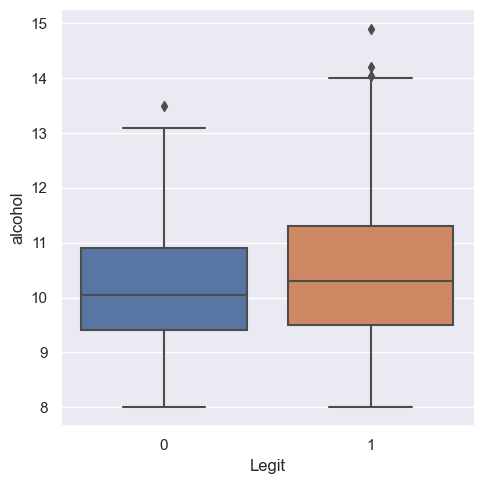

In [13]:
sns.catplot(df, x="Legit", y="alcohol", kind="box")

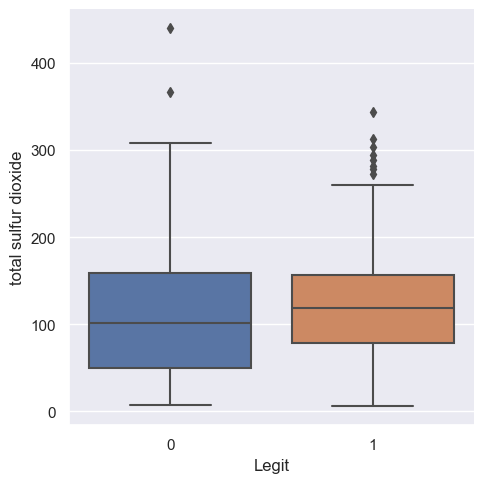

In [14]:
sns.catplot(df, x="Legit", y="total sulfur dioxide", kind="box")

[Text(0, 0, '4898'), Text(0, 0, '1599')]

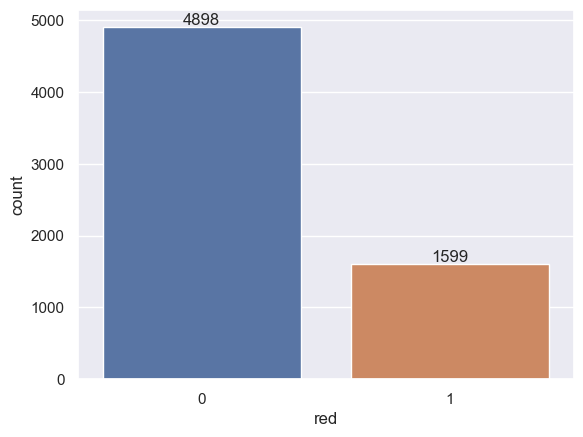

In [15]:
ax = sns.countplot(x = 'red', data = df);
ax.bar_label(ax.containers[0])
# Red 1 - White 0

[Text(0, 0, '246'), Text(0, 0, '6251')]

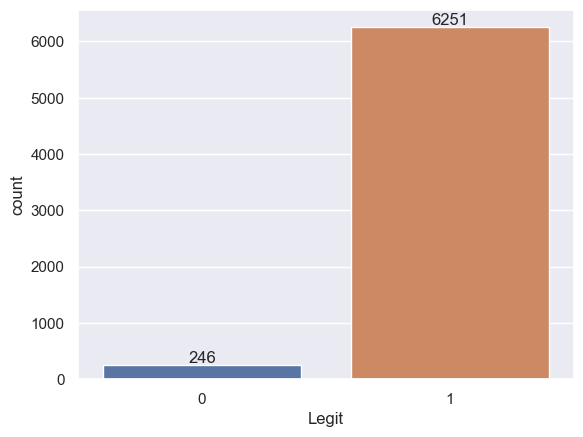

In [16]:
ax = sns.countplot(x = 'Legit', data = df);
ax.bar_label(ax.containers[0])
# Legit 1 - Fraud 0

Observaciones relevantes:
- Tal como las instrucciones lo indicaban, los datos entre si era legit o fraud no están balanceados
- Existen patrones en la correlación de las clases que muestran cuando el vino es fraude
- Casi todos los datos siguen un comportamiento normal extándar. 

## Modelo 1: Modelo Lineal

## Normalización de los Datos

In [17]:
df = df.drop('white', axis= 1)
df = df.drop('Legit', axis = 1) 
print(df)

      fixed acidity  volatile acidity  citric acid  residual sugar  chlorides  \
0               7.4              0.70         0.00             1.9      0.076   
1               7.8              0.88         0.00             2.6      0.098   
2               7.8              0.76         0.04             2.3      0.092   
3              11.2              0.28         0.56             1.9      0.075   
4               7.4              0.70         0.00             1.9      0.076   
...             ...               ...          ...             ...        ...   
6492            6.2              0.21         0.29             1.6      0.039   
6493            6.6              0.32         0.36             8.0      0.047   
6494            6.5              0.24         0.19             1.2      0.041   
6495            5.5              0.29         0.30             1.1      0.022   
6496            6.0              0.21         0.38             0.8      0.020   

      free sulfur dioxide  

In [18]:
y = df.iloc[:, -2].values # conseguir los datos antes de eliminarlos
df = df.drop('Fraud', axis = 1)
X = df.iloc[:, :].values

In [19]:
print(X)

[[ 7.4   0.7   0.   ...  0.56  9.4   1.  ]
 [ 7.8   0.88  0.   ...  0.68  9.8   1.  ]
 [ 7.8   0.76  0.04 ...  0.65  9.8   1.  ]
 ...
 [ 6.5   0.24  0.19 ...  0.46  9.4   0.  ]
 [ 5.5   0.29  0.3  ...  0.38 12.8   0.  ]
 [ 6.    0.21  0.38 ...  0.32 11.8   0.  ]]


In [20]:
print(y)

[0 0 0 ... 0 0 0]


In [21]:
from sklearn.preprocessing import StandardScaler
normalizador = StandardScaler()
X = normalizador.fit_transform(X)

In [22]:
print(X)

[[ 0.14247327  2.18883292 -2.19283252 ...  0.19309677 -0.91546416
   1.75018984]
 [ 0.45103572  3.28223494 -2.19283252 ...  0.99957862 -0.58006813
   1.75018984]
 [ 0.45103572  2.55330026 -1.91755268 ...  0.79795816 -0.58006813
   1.75018984]
 ...
 [-0.55179227 -0.6054167  -0.88525328 ... -0.47897144 -0.91546416
  -0.57136659]
 [-1.32319841 -0.30169391 -0.12823371 ... -1.016626    1.9354021
  -0.57136659]
 [-0.93749534 -0.78765037  0.42232597 ... -1.41986693  1.09691202
  -0.57136659]]


In [23]:
print(y)

[0 0 0 ... 0 0 0]


## Entrenamiento

Separación de datos de entrenamiento y de prueba

In [24]:
from sklearn.model_selection import train_test_split
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(X, y, test_size = 0.2, random_state = 100)

In [25]:
print(X_entreno)

[[ 0.68245757 -0.48392759  0.35350601 ...  1.13399226  0.34227095
  -0.57136659]
 [-0.08894858  1.52064279 -2.0551926  ... -0.00852369 -0.66391714
   1.75018984]
 [-1.2460578  -0.84839493  2.34928485 ... -0.6805919  -0.07697409
  -0.57136659]
 ...
 [-0.24322981  0.06277343  1.59226529 ... -1.62148739 -0.66391714
  -0.57136659]
 [-0.78321411 -0.30169391 -0.19705367 ... -0.14293733  0.03482459
  -0.57136659]
 [-0.78321411 -0.6054167  -0.6787934  ... -0.07573051 -0.99931317
  -0.57136659]]


In [26]:
print(y_entreno)
valores = {0: 0, 1: 0}
for a in y_entreno:
    valores[a] += 1
        
print(valores)

[0 0 0 ... 0 0 0]
{0: 4998, 1: 199}


## Balanceo de datos

In [27]:
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_entreno, y_entreno = smote.fit_resample(X_entreno, y_entreno)

## Creación del clasificador basado en SVM

In [28]:
from sklearn.svm import SVC
clasificador = SVC(kernel = 'linear', random_state = 2)
clasificador.fit(X_entreno, y_entreno)

SVC(kernel='linear', random_state=2)

## Predicción

In [29]:
y_pred = clasificador.predict(X_prueba)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[0 0]
 [0 0]
 [0 0]
 ...
 [0 0]
 [1 0]
 [0 0]]


In [30]:
from sklearn.metrics import confusion_matrix, accuracy_score
mat_conf = confusion_matrix(y_prueba, y_pred)
print(mat_conf)
accuracy_score(y_prueba, y_pred)

[[980 273]
 [ 10  37]]


0.7823076923076923

## Modelo 2: Modelo Polinomial (Grado 3 y 4)

In [31]:
# Leer archivo csv
df = pd.read_csv('./wine_fraud.csv')

#Se realiza la codificación de la columna quality
data_encoded = pd.get_dummies(df, columns=['quality'], prefix='', prefix_sep='')
df = data_encoded
#Se realiza la codificación de la columna type
data_encoded2 = pd.get_dummies(df, columns=['type'], prefix='', prefix_sep='')
df = data_encoded2

# Se realiza un cambio de tipos de variable para un mayor orden
df["Fraud"] = df["Fraud"].astype('int64')
df["Legit"] = df["Legit"].astype('int64')
df["red"] = df["red"].astype('int64')
df["white"] = df["white"].astype('int64')

df = df.drop('white', axis= 1)
df = df.drop('Legit', axis = 1) 

In [32]:
y = df.iloc[:, -2].values # conseguir los datos antes de eliminarlos
df = df.drop('Fraud', axis = 1)
X = df.iloc[:, :].values

In [33]:
from sklearn.preprocessing import StandardScaler
normalizador = StandardScaler()
X = normalizador.fit_transform(X)

In [34]:
from sklearn.model_selection import train_test_split
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(X, y, test_size = 0.2, random_state = 101)

In [35]:
valores = {0: 0, 1: 0}
for a in y_entreno:
    valores[a] += 1
    
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_entreno, y_entreno = smote.fit_resample(X_entreno, y_entreno)

In [36]:
from sklearn.svm import SVC
clasificador = SVC(kernel = 'poly', random_state = 2)
clasificador.fit(X_entreno, y_entreno)

SVC(kernel='poly', random_state=2)

In [37]:
y_pred = clasificador.predict(X_prueba)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[0 0]
 [0 0]
 [0 0]
 ...
 [0 0]
 [0 0]
 [0 0]]


In [38]:
from sklearn.metrics import confusion_matrix, accuracy_score
mat_conf = confusion_matrix(y_prueba, y_pred)
print(mat_conf)
accuracy_score(y_prueba, y_pred)

[[1086  167]
 [  18   29]]


0.8576923076923076

In [39]:
from sklearn.svm import SVC
clasificador = SVC(kernel = 'poly', degree=4, random_state = 2)
clasificador.fit(X_entreno, y_entreno)

SVC(degree=4, kernel='poly', random_state=2)

In [40]:
y_pred = clasificador.predict(X_prueba)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[0 0]
 [0 0]
 [0 0]
 ...
 [0 0]
 [0 0]
 [0 0]]


In [41]:
from sklearn.metrics import confusion_matrix, accuracy_score
mat_conf = confusion_matrix(y_prueba, y_pred)
print(mat_conf)
accuracy_score(y_prueba, y_pred)

[[1125  128]
 [  20   27]]


0.8861538461538462

## Modelo 3: Modelo RBF (Función Radial)

In [42]:
# Leer archivo csv
df = pd.read_csv('./wine_fraud.csv')

#Se realiza la codificación de la columna quality
data_encoded = pd.get_dummies(df, columns=['quality'], prefix='', prefix_sep='')
df = data_encoded
#Se realiza la codificación de la columna type
data_encoded2 = pd.get_dummies(df, columns=['type'], prefix='', prefix_sep='')
df = data_encoded2

# Se realiza un cambio de tipos de variable para un mayor orden
df["Fraud"] = df["Fraud"].astype('int64')
df["Legit"] = df["Legit"].astype('int64')
df["red"] = df["red"].astype('int64')
df["white"] = df["white"].astype('int64')

df = df.drop('white', axis= 1)
df = df.drop('Legit', axis = 1) 

In [43]:
y = df.iloc[:, -2].values # conseguir los datos antes de eliminarlos
df = df.drop('Fraud', axis = 1)
X = df.iloc[:, :].values

In [44]:
from sklearn.preprocessing import StandardScaler
normalizador = StandardScaler()
X = normalizador.fit_transform(X)

In [45]:
from sklearn.model_selection import train_test_split
X_entreno, X_prueba, y_entreno, y_prueba = train_test_split(X, y, test_size = 0.2, random_state = 102)

In [46]:
valores = {0: 0, 1: 0}
for a in y_entreno:
    valores[a] += 1
    
from imblearn.over_sampling import SMOTE
smote = SMOTE()
X_entreno, y_entreno = smote.fit_resample(X_entreno, y_entreno)

In [47]:
from sklearn.svm import SVC
clasificador = SVC(kernel = 'rbf', random_state = 2)
clasificador.fit(X_entreno, y_entreno)

SVC(random_state=2)

In [48]:
y_pred = clasificador.predict(X_prueba)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_prueba.reshape(len(y_prueba),1)),1))

[[0 0]
 [0 0]
 [0 0]
 ...
 [1 0]
 [0 0]
 [0 0]]


In [49]:
from sklearn.metrics import confusion_matrix, accuracy_score
mat_conf = confusion_matrix(y_prueba, y_pred)
print(mat_conf)
accuracy_score(y_prueba, y_pred)

[[1085  170]
 [  20   25]]


0.8538461538461538

## Hallazgos y conclusiones

Para comenzar se realizó una limpieza de los datos como por ejemplo la codificación de algunas características para que fueran 1 o 0 dependiendo de su valor y así poder analizar mejor los datos, también se eliminaron algunas columnas debido a que generaban data repetida, esto se realizó principalmente en características como: "quality" y "type" ya que al ser codificadas, si no era el valor 1 entonces su valor sería 0.

Los diferentes modelos desarrollados se basan en SVM y se modifican ciertos parámetros para saber cuál es el más óptimo dada la estructura del dataset limpio. Para comenzar se trabajó con un SVM lineal cuya precisión fue de 0.784 aproximadamente, que a pesar de ser bueno consideramos que se podría mejorar. Procedimos a construir un modelo nuevo pero esta vez con un SVM polinomial que se dividió en dos pruebas, la primera prueba contaba con un grado 3 y su precisión fue de 0.859 aprox; y la segunda prueba contaba con un grado 4 dando una precisión del 0.889 aprox. Mientras más grande era el grado utilizado, la precisión aumentaba pero esto causaba overfitting por lo que decidimos únicamente tomar el comportamiento de un grado mayor. El último modelo con el que trabajamos fue un SVM de función radial (rbf), este es la versión default del SVM para esta librería y la precisión de este fue de 0.856 aprox.

Tomando todos los resultados pudimos notar que el mejor modelo, y el que se recomienda utilizar, sería el SVM polinomial con grado 4 debido a que este presenta una mayor precisión y, por la estructura del dataset, tiene sentido que se ajuste mejor ya que existen diversas características a tomar en cuenta como para realizar un proceso lineal. Otra opción viable es el SVM de función radial ya que también se ajusta bien al dataset y presenta resultados casi tan buenos como el SVM polinomial de grado 3.

En conclusión el modelo SVM polinomial de grado 4 desarrollado permite predecir y determinar si un tipo de vino es legítimo o fraudulento a través de diferentes características resultantes de un análisis químico presentando una precisión alta en su respuesta final.